In [ ]:
###############################################################################
# layer3으로 변경하고 보면 유의 미한 차이가 있었다.
# 하지만 IoU 값은 일정한 경향성이 없이 크고 작고를 반복하는 현상을 볼 수 있었다.
# 그럼 threshold=0.5 값을 변경하면 어떤 효과가 있을지 비교해 보자
###############################################################################

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


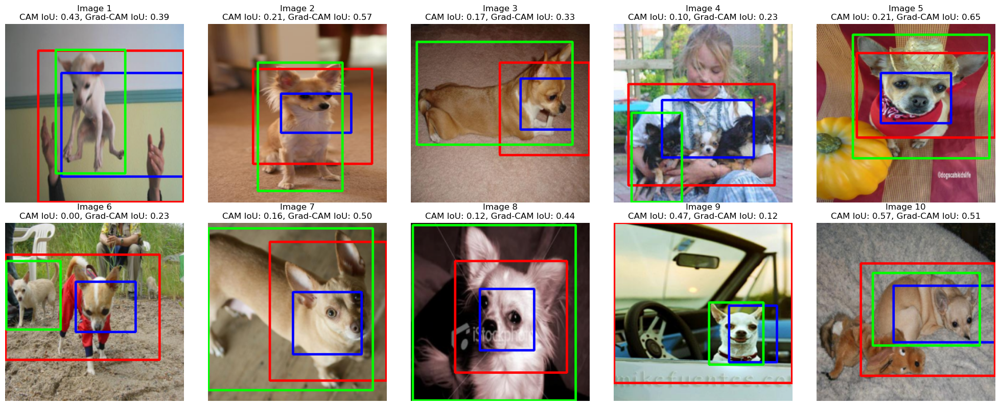

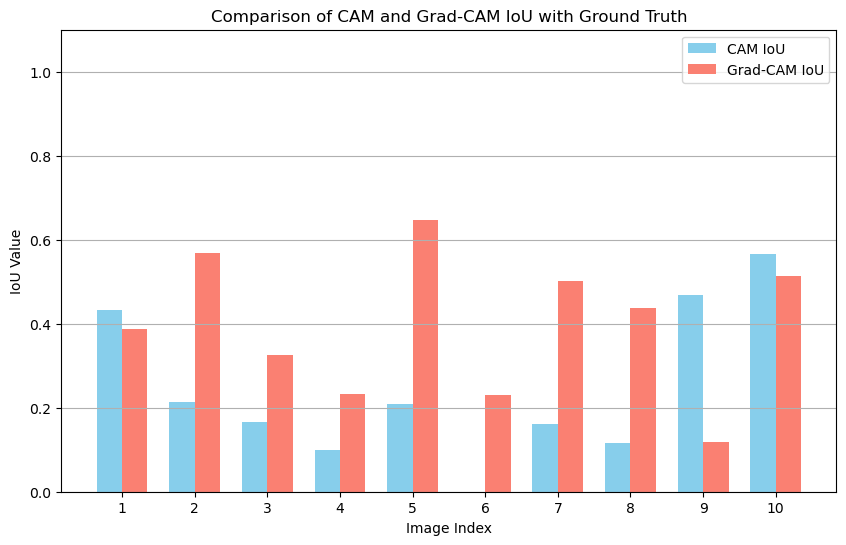

In [ ]:
# GradCAM threshold=0.1

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious1 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.1)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious1.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious1, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


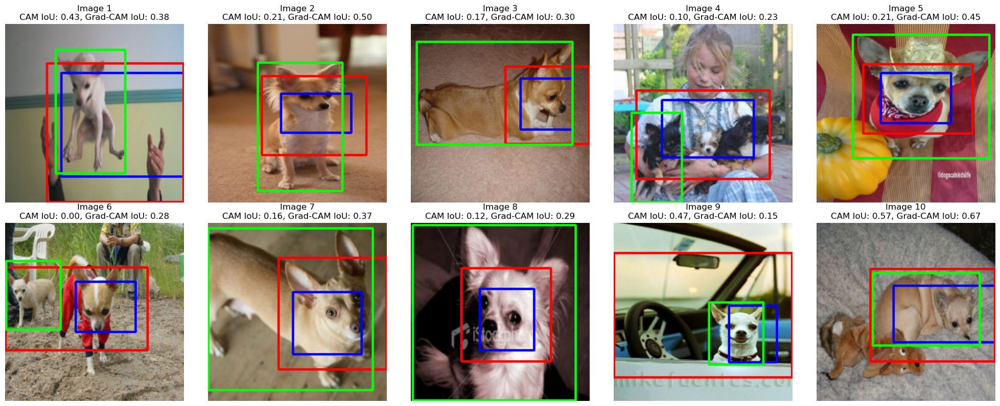

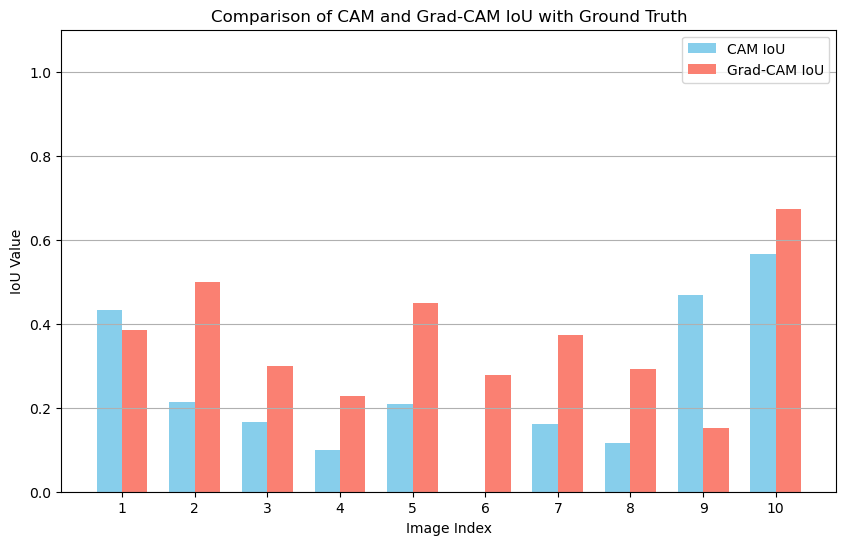

In [ ]:
# GradCAM threshold=0.2

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious2 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.2)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious2.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious2, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


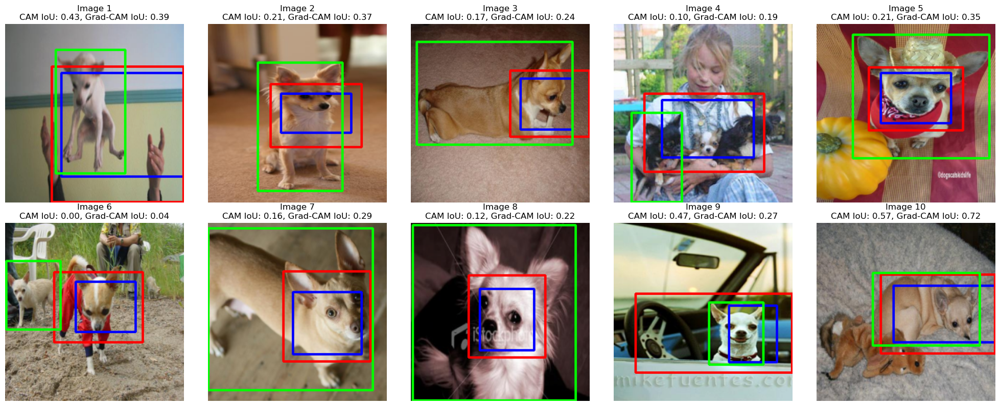

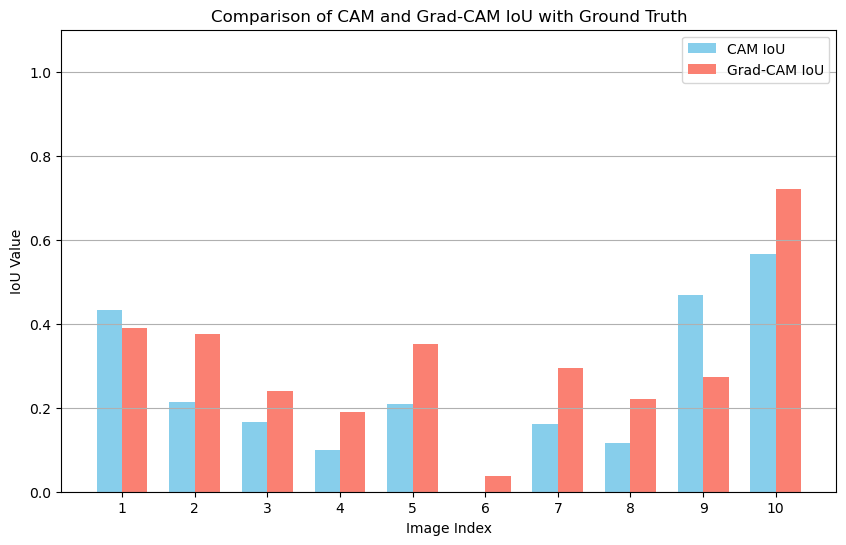

In [ ]:
# GradCAM threshold=0.3

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious3 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.3)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious3.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious3, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


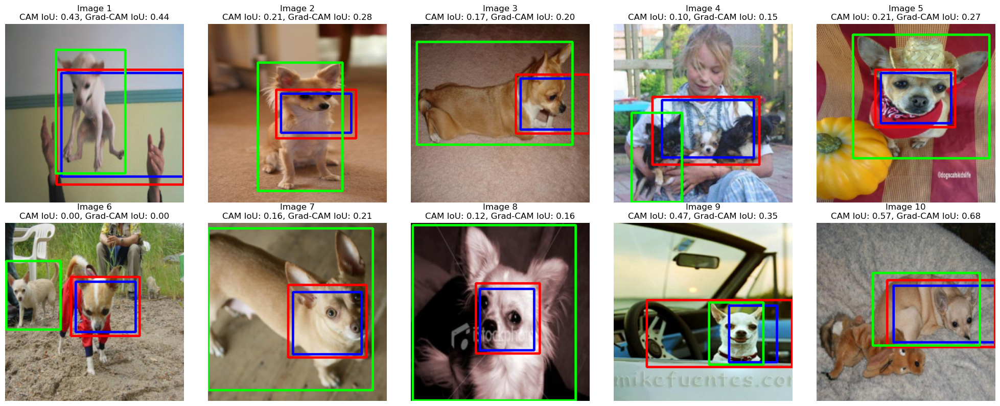

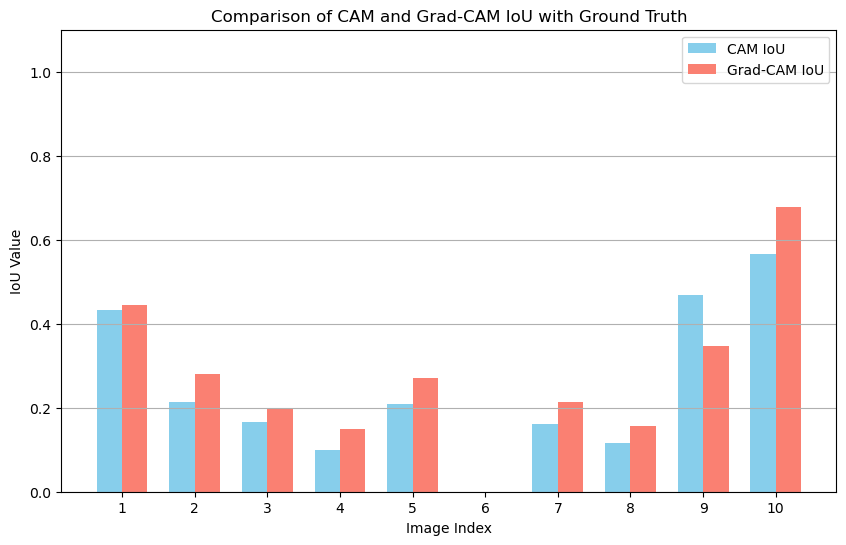

In [ ]:
# GradCAM threshold=0.4

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious4 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.4)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious4.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious4, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


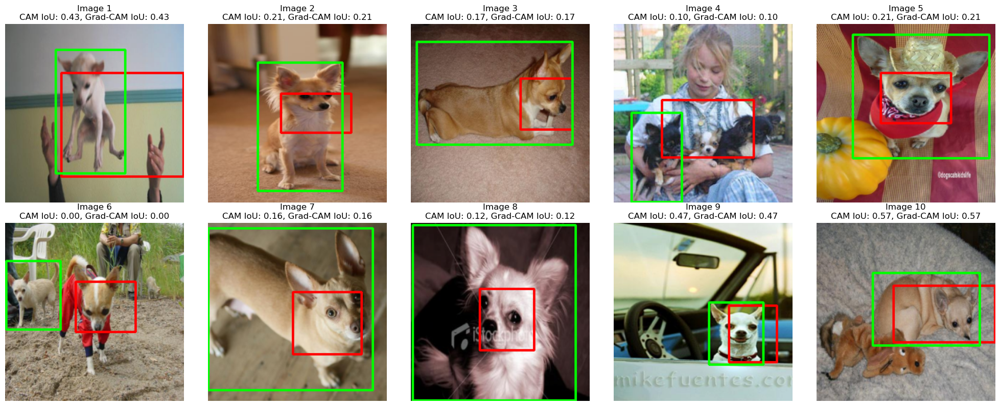

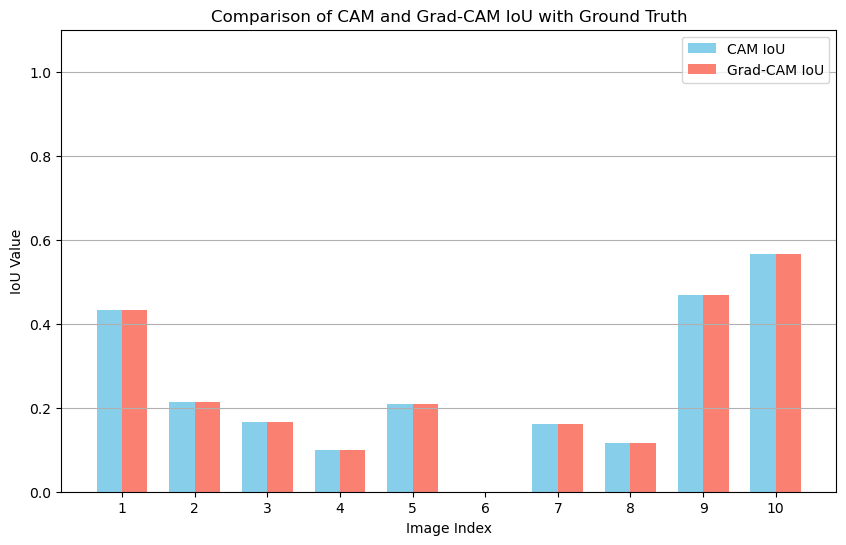

In [ ]:
# GradCAM threshold=0.5

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious5 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.5)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious5.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious5, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


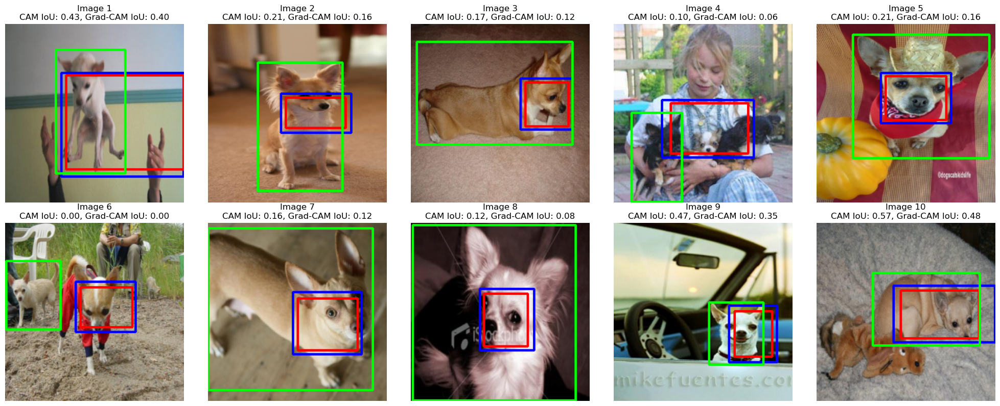

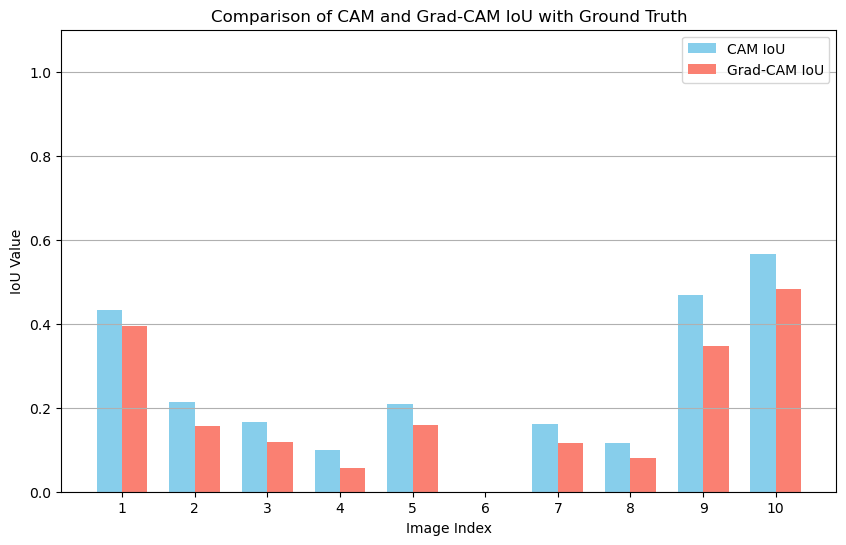

In [ ]:
# GradCAM threshold=0.6

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious6 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.6)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious6.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious6, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


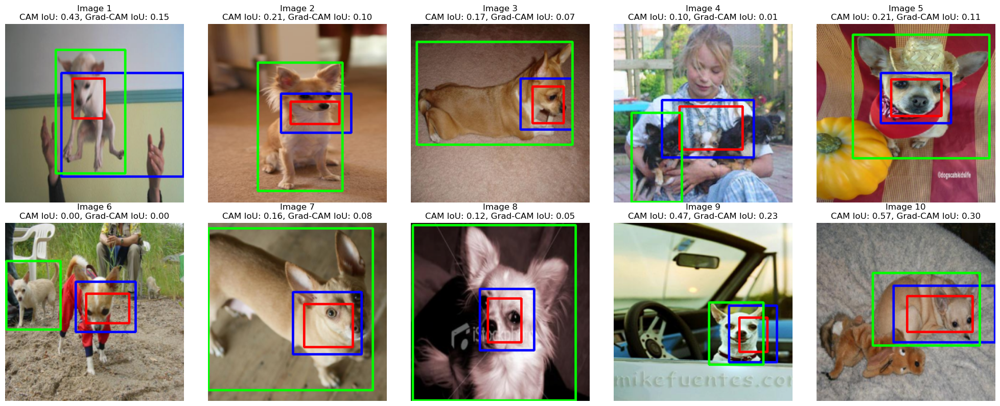

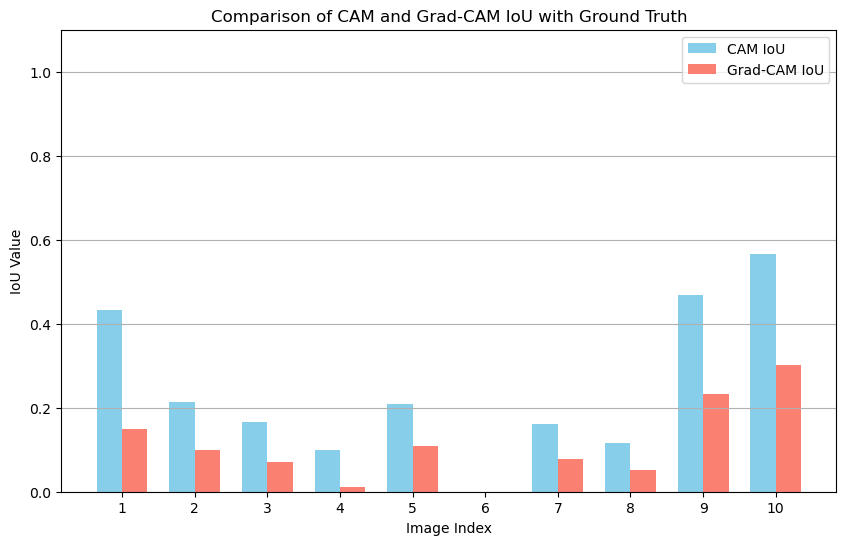

In [ ]:
# GradCAM threshold=0.7

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious7 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.7)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious7.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious7, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

/opt/conda/lib/python3.12/site-packages/torch/nn/modules/module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


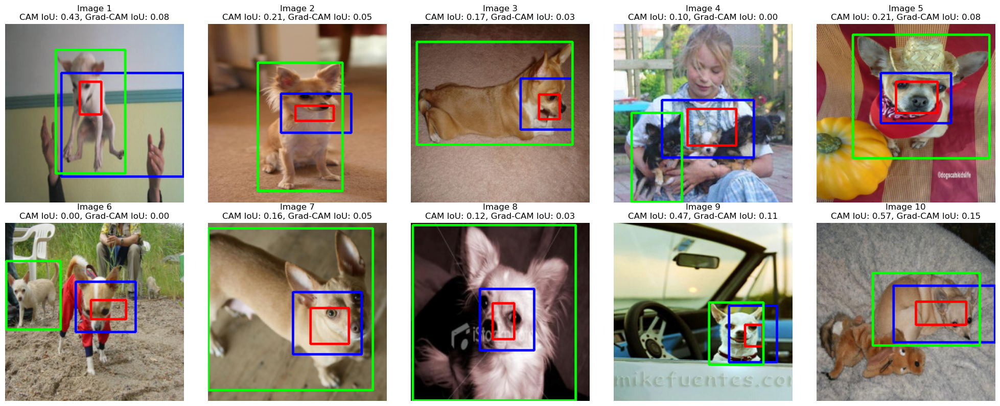

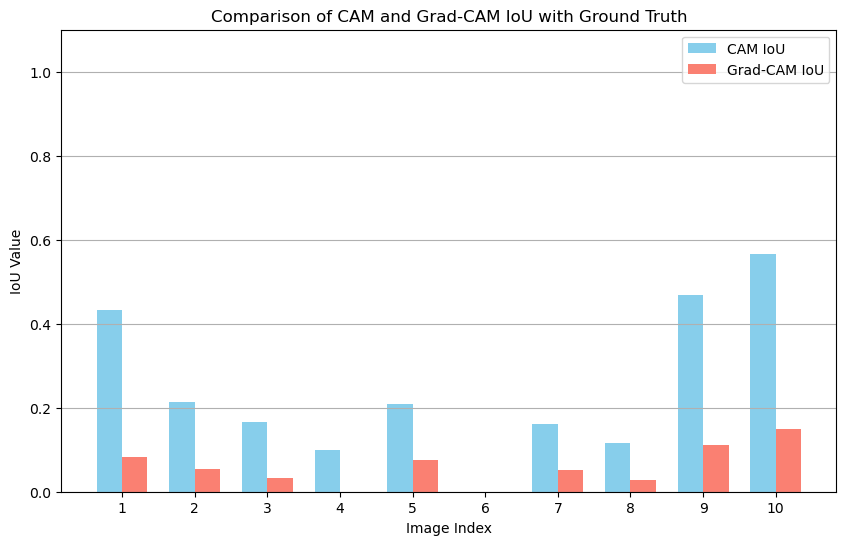

In [ ]:
# GradCAM threshold=0.8

# IoU 값을 저장할 리스트
cam_ious = []
grad_cam_ious8 = []

# 시각화를 위한 서브플롯 설정
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# 10개의 이미지에 대해 반복
for i in range(10):
    # 1. 데이터 로드 및 전처리
    image, label, ground_bbox = train_dataset[i]
    sample_image = image.unsqueeze(0).to(device)
    orig_img = unnormalize(image)

    # 2. CAM 및 Grad-CAM 생성
    cam_image = generate_cam(model, sample_image)
    grad_cam_image = generate_grad_cam1(model, sample_image, target_layer_name="layer4")

    # 3. CAM 및 Grad-CAM에서 bbox 추출
    cam_resized = cv2.resize(cam_image, (orig_img.shape[1], orig_img.shape[0]))
    grad_cam_resized = cv2.resize(grad_cam_image, (orig_img.shape[1], orig_img.shape[0]))

    bbox_CAM = get_bbox(cam_resized, threshold=0.5)
    bbox_GradCAM = get_bbox(grad_cam_resized, threshold=0.8)

    # 4. IoU 계산 및 저장
    ground_truth = [int(x) for x in ground_bbox]
    cam_iou = get_iou(bbox_CAM, ground_truth)
    grad_cam_iou = get_iou(bbox_GradCAM, ground_truth)

    cam_ious.append(cam_iou)
    grad_cam_ious8.append(grad_cam_iou)

    # 5. 시각화
    bboxes_to_draw = [
        (bbox_CAM, (0, 0, 255)),    # CAM (파란색)
        (bbox_GradCAM, (255, 0, 0)),  # Grad-CAM (빨간색)
        (ground_truth, (0, 255, 0))    # Ground Truth (초록색)
    ]
    img_with_all_bboxes = visualize_multiple_bboxes(orig_img, bboxes_to_draw)

    axes[i].imshow(img_with_all_bboxes)
    axes[i].set_title(f"Image {i+1}\nCAM IoU: {cam_iou:.2f}, Grad-CAM IoU: {grad_cam_iou:.2f}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# ---
# 6. IoU 값 비교 그래프
plt.figure(figsize=(10, 6))
x = np.arange(10)
width = 0.35

plt.bar(x - width/2, cam_ious, width, label='CAM IoU', color='skyblue')
plt.bar(x + width/2, grad_cam_ious8, width, label='Grad-CAM IoU', color='salmon')

plt.xlabel("Image Index")
plt.ylabel("IoU Value")
plt.title("Comparison of CAM and Grad-CAM IoU with Ground Truth")
plt.xticks(x, [f"{i+1}" for i in range(10)])
plt.ylim(0, 1.1)
plt.legend()
plt.grid(axis='y')
plt.show()

In [ ]:
###############################################################################
# threshold 값의 변화에 따른 변화를 확인해 보았다
# 전반적으로 0.1의 낮은 threshold 값을 가진때 가장 높은 IoU 값을 보였다.
# 하지만 그렇지 않은 경우도 있었다.
# 0.1~0.8까지의 변화를 그래프로 그려보자
###############################################################################

In [ ]:
# 각 값이 어떻게 구성되어 있는지 확인한다.
print(grad_cam_ious8)

[np.float64(0.08209121245828699), np.float64(0.05343958748388609), np.float64(0.03204134366925065), np.float64(0.0), np.float64(0.07651386530843238), np.float64(0.0), np.float64(0.051652398488689084), np.float64(0.027072192513368985), np.float64(0.11199095022624435), np.float64(0.14982778415614237)]


/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 44050 (\N{HANGUL SYLLABLE GABS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 44060 (\N{HANGUL SYLLABLE GAE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 54744 (\N{HANGUL SYLLABLE HEOM}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 50640 (\N{HANGUL SYLLABLE E}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/

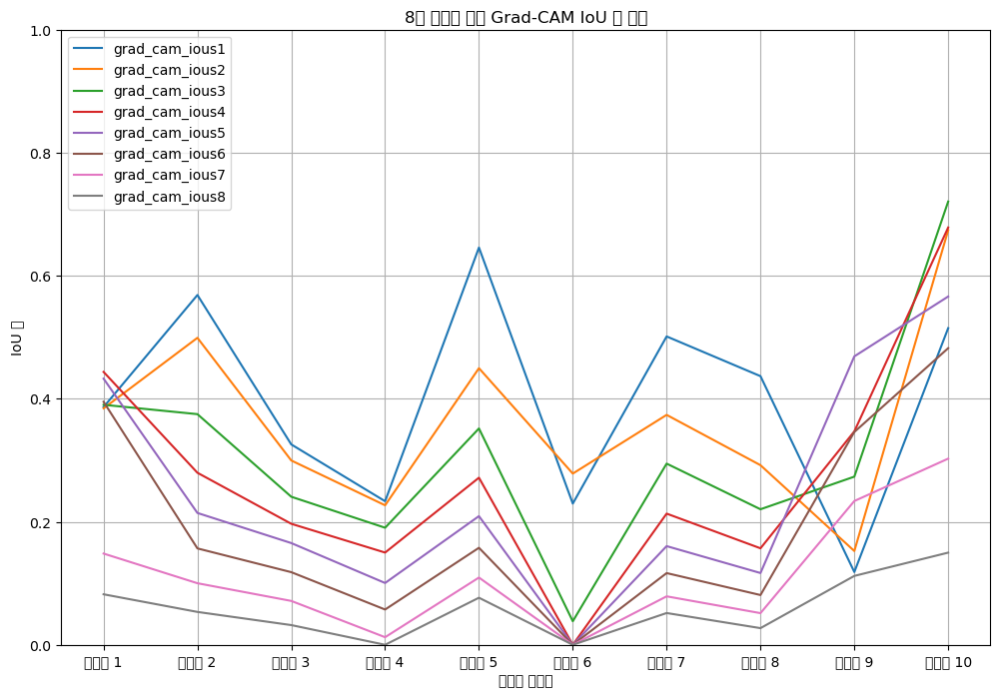

In [ ]:
# grad_cam_ious1부터 grad_cam_ious8까지 8개의 IoU 값 리스트를 하나의 그래프로 시각화
# 시각화할 데이터들을 하나의 리스트에 모읍니다.
all_ious = [grad_cam_ious1, grad_cam_ious2, grad_cam_ious3, grad_cam_ious4, grad_cam_ious5, grad_cam_ious6, grad_cam_ious7, grad_cam_ious8]

# 각 데이터셋의 이름 (라벨)
labels = [f"grad_cam_ious{i}" for i in range(1, 9)]

plt.figure(figsize=(12, 8))

# 각 리스트를 그래프에 선으로 그립니다.
for i in range(len(all_ious)):
    plt.plot(all_ious[i], label=labels[i])

plt.xlabel("이미지 인덱스")
plt.ylabel("IoU 값")
plt.title("8개 실험에 대한 Grad-CAM IoU 값 비교")
plt.xticks(np.arange(len(all_ious[0])), [f"이미지 {j+1}" for j in range(len(all_ious[0]))])
plt.ylim(0, 1.0)
plt.legend()
plt.grid(True)
plt.show()


<img src="2025-09-03 224016.png" alt="스크린샷" width="500">

## 결론
대부분의 경우 Ground Truth box가 개의 몸통을 포함하기 때문에 box가 큰 경향이 있다. 그리고 CAM을 이용한 box는 개의 얼굴이나 일부분을 주로 잡기 때문에 전반적으로는 threshold 값이 낮으면 IoU 값이 높아지는 것으로 보인다.
그러나 개의 몸통을 제외한 얼굴 부분만 있거나 모델 성능이 낮아 엉뚱한 부분을 찾는 경우 또 히려 모델 성능이 좋아 잘 찾는 경우에 따라서 IoU 값은 매우 달라지게 된다.
따라서 IoU 값으로 사람 대비 일반화 성능을 판단하기는 어려울 것 같다.


## 회고
이번에는 최대한 코드를 이해하면서 결과를 뽑기위해 노력해 봤다.
모델을 더 잘 훈련 시키고 했으면 다른 결론이 났을까? 그렇지 않을 것 같다.
이전에 회사에서 무지성 학습을 돌릴때는 이런 개념이 전혀 없어 CAM을 볼 수 있는
생각을 못했었다.
그러나 이렇게 CAM으로 보면 쉽게 학습이 얼마나 잘 되었는지를 판단 할 수 있을 것 같아 이후에 활용이 기대된다.